# Problem Statement

###  Task 2:

- Extract reviews for any movie from IMDB and perform sentiment analysis.


We will extract reviews of the movie `Tenet`. 

In [1]:
import pandas as pd
import requests
from bs4 import BeautifulSoup


url = (
    "https://www.imdb.com/title/tt6723592/reviews/_ajax?ref_=undefined&paginationKey={}"
)
key = ""
data = {"title": [], "review": []}

while True:
    response = requests.get(url.format(key))
    soup = BeautifulSoup(response.content, "html.parser")
    # Find the pagination key
    pagination_key = soup.find("div", class_="load-more-data")
    if not pagination_key:
        break

    # Update the `key` variable in-order to scrape more reviews
    key = pagination_key["data-key"]
    for title, review in zip(
        soup.find_all(class_="title"), soup.find_all(class_="text show-more__control")
    ):
        data["title"].append(title.get_text(strip=True))
        data["review"].append(review.get_text())

df = pd.DataFrame(data)
print(df)

                                                  title  \
0                                      Explanation Post   
1     Necessary to watch twice, preferably with subt...   
2                                      I think I'm dumb   
3                Why does a film need multiple watches?   
4                                             Confusing   
...                                                 ...   
5069                                           One lime   
5070                                 I guess I'm stupid   
5071                                 a true masterpiece   
5072         One of the best action movies ever, but...   
5073              Finally time for Tenet in the cinema.   

                                                 review  
0     Hello again folks. I enjoy leaving reviews for...  
1     Its somewhat ironic that a movie about time tr...  
2     Well, I've always known I was a little slow to...  
3     As the first scene of Tenet came to an end, I ...  
4

In [3]:
df.head()

,title,review
0,Explanation Post,Hello again folks. I enjoy leaving reviews for...
1,"Necessary to watch twice, preferably with subt...",Its somewhat ironic that a movie about time tr...
2,I think I'm dumb,"Well, I've always known I was a little slow to..."
3,Why does a film need multiple watches?,"As the first scene of Tenet came to an end, I ..."
4,Confusing,I have honestly never felt so confused after w...


In [13]:
# saving reviews into new list

reviews = df['review'].to_list()
reviews

["Hello again folks. I enjoy leaving reviews for these mind twisting movies. Here I will do my best and explain the timelines of the 4 major characters. All characters go through a RED timeline and a BLUE timeline. RED is moving forward and BLUE is moving backwards in the RED timeline. I hope that makes sense. Here we go!1) The Sator Timeline. When he's a young man he finds a box while working in Russia. The box contains gold and the BLUE technology. He's on a mission to find pieces for a doomsday devise that wipes out existence. The last piece he needs is missing. He threatens Kat's life with the Protagonist. He uses the Blue technology to recover the missing piece. He now has all the pieces for the doomsday device. He than goes back to the day on the yacht in the RED timeline. The day where Kat sees SOMEONE dive off the boat and says he disappeared.2) TheProtagonist timeline. After the opening opera scene he is tortured, passes a test, and is recruited. He learns of the BLUE technolo

In [8]:
import nltk
from nltk.corpus import stopwords

In [9]:
import re

In [14]:
with open('reviews.txt','w', encoding='utf-8') as output:
    output.write(str(reviews))

In [16]:
reviews_string = " ".join(reviews)

In [17]:
reviews_string = re.sub("[^A-Za-z" "]+"," ", reviews_string).lower()
reviews_string = re.sub("[0-9" "]+"," ",reviews_string)
reviews_string

'hello again folks i enjoy leaving reviews for these mind twisting movies here i will do my best and explain the timelines of the major characters all characters go through a red timeline and a blue timeline red is moving forward and blue is moving backwards in the red timeline i hope that makes sense here we go the sator timeline when he s a young man he finds a box while working in russia the box contains gold and the blue technology he s on a mission to find pieces for a doomsday devise that wipes out existence the last piece he needs is missing he threatens kat s life with the protagonist he uses the blue technology to recover the missing piece he now has all the pieces for the doomsday device he than goes back to the day on the yacht in the red timeline the day where kat sees someone dive off the boat and says he disappeared theprotagonist timeline after the opening opera scene he is tortured passes a test and is recruited he learns of the blue technology he gathers information to

In [18]:
reviews_words = reviews_string.split(" ")
reviews_words

['hello',
 'again',
 'folks',
 'i',
 'enjoy',
 'leaving',
 'reviews',
 'for',
 'these',
 'mind',
 'twisting',
 'movies',
 'here',
 'i',
 'will',
 'do',
 'my',
 'best',
 'and',
 'explain',
 'the',
 'timelines',
 'of',
 'the',
 'major',
 'characters',
 'all',
 'characters',
 'go',
 'through',
 'a',
 'red',
 'timeline',
 'and',
 'a',
 'blue',
 'timeline',
 'red',
 'is',
 'moving',
 'forward',
 'and',
 'blue',
 'is',
 'moving',
 'backwards',
 'in',
 'the',
 'red',
 'timeline',
 'i',
 'hope',
 'that',
 'makes',
 'sense',
 'here',
 'we',
 'go',
 'the',
 'sator',
 'timeline',
 'when',
 'he',
 's',
 'a',
 'young',
 'man',
 'he',
 'finds',
 'a',
 'box',
 'while',
 'working',
 'in',
 'russia',
 'the',
 'box',
 'contains',
 'gold',
 'and',
 'the',
 'blue',
 'technology',
 'he',
 's',
 'on',
 'a',
 'mission',
 'to',
 'find',
 'pieces',
 'for',
 'a',
 'doomsday',
 'devise',
 'that',
 'wipes',
 'out',
 'existence',
 'the',
 'last',
 'piece',
 'he',
 'needs',
 'is',
 'missing',
 'he',
 'threatens',
 

In [20]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [21]:
vectorizer = TfidfVectorizer(reviews_words, use_idf=True, ngram_range=(1,3))
X = vectorizer.fit_transform(reviews_words)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [29]:
with open("stopwords_en.txt","r") as sw:
    stop_words = sw.read()

stop_words = stop_words.split("/n")

In [30]:
reviews_words = [w for w in reviews_words if not w in stop_words]

In [31]:
reviews_string = " ".join(reviews_words)
reviews_string

'hello again folks enjoy leaving reviews these mind twisting movies here will best explain timelines major characters all characters go through red timeline blue timeline red moving forward blue moving backwards red timeline hope that makes sense here we go sator timeline when young man finds box while working russia box contains gold blue technology mission find pieces doomsday devise that wipes out existence last piece needs missing threatens kat life with protagonist uses blue technology recover missing piece all pieces doomsday device than goes back day yacht red timeline day where kat sees someone dive off boat says disappeared theprotagonist timeline after opening opera scene tortured passes test recruited learns blue technology gathers information lead him down path finds missing piece sator after kat gets shot then uses blue technology heal heal blue timeline because was shot with blue technology only way come back red timeline was through another blue red machine only seen was

In [62]:
stop_words.extend(["i","got","fossil","amazon","u","ask","dont","think","t","now","lot","n","soo","watch","product","a","s","to",
                  "ok","u","it","so","this","is","at", "don","in","one","the","of","any","not","he","she","am","by","you","the","and","as","do","its",
                  "for","as","has","if","my","till","there","can","get","or","on","k", "as",'that','they',"are","all","but","I",
                  "where","they","they","no","see","an","into",",more","go","out","after","gets","had", "comes","movie","film","tenet",
                  "nolan","john","david","washington", "washingtono","chris","christopher"])

In [63]:
reviews_words = [w for w in reviews_words if not w in stop_words]
reviews_string = " ".join(reviews_words)
reviews_string

'hello again folks enjoy leaving reviews these mind twisting movies here will best explain timelines major characters characters through red timeline blue timeline red moving forward blue moving backwards red timeline hope makes sense here we sator timeline when young man finds box while working russia box contains gold blue technology mission find pieces doomsday devise wipes existence last piece needs missing threatens kat life with protagonist uses blue technology recover missing piece pieces doomsday device than goes back day yacht red timeline day kat sees someone dive off boat says disappeared theprotagonist timeline opening opera scene tortured passes test recruited learns blue technology gathers information lead him down path finds missing piece sator kat shot then uses blue technology heal heal blue timeline because was shot with blue technology only way come back red timeline was through another blue red machine only seen was airport protagonist must them back red timeline us

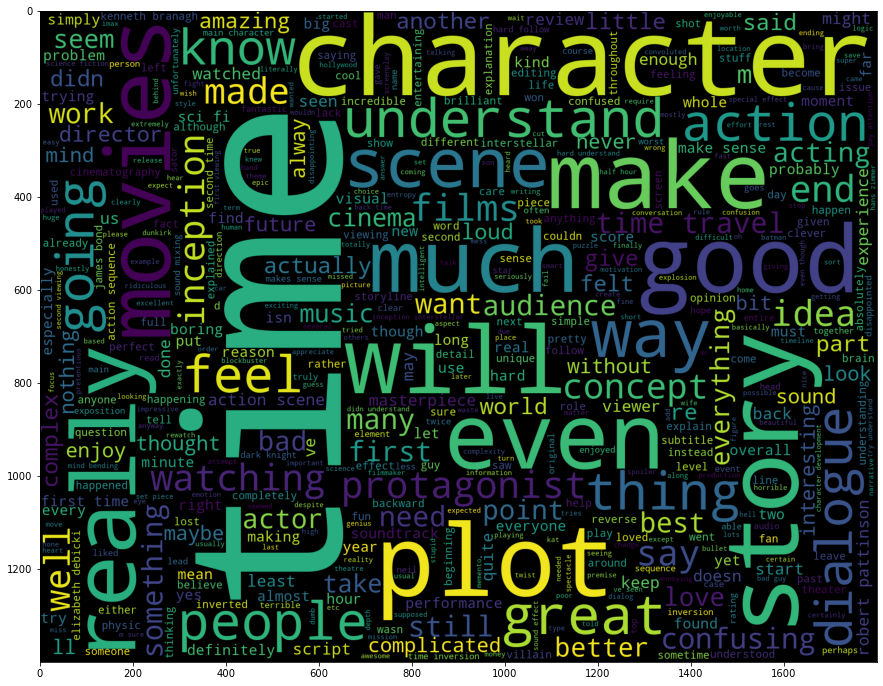

In [64]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud
plt.rcParams['figure.figsize']=(15,20)
wordcloud_ip = WordCloud(
                      background_color='Black',
                      width=1800,
                      height=1400,
                      max_words=500,
                      ).generate(reviews_string)

plt.imshow(wordcloud_ip)

# Positive Words

In [42]:
with open("positive-words.txt","r") as pos:
    poswords = pos.read().split("\n")

In [43]:
ip_pos_words = " ".join([w for w in reviews_words if w in poswords])
ip_pos_words

'enjoy best gold recover lead heal heal clears best helpful thank properly blockbuster properly accurate helped like liked charming worth well right unreal advocate great afford good pretty cool cool good interesting masterpiece good charming smooth fantastic well awesome sufficient good love fair soft humble better enjoy interesting well great outstanding enjoy fun pleasure intricate kudos fantastic rewarding good solid spectacular flawless standout capable great great masterful continuity better good interesting amazing interesting pretty fast quiet interesting worth worth glad pretty good good prestige fresh evocative enticed like well enough interesting enough amazingly like cool fast genius good charm best glamorous modern loved great great great great smart convincing hero beautiful good like masterpiece greatest best win leading best believable clever lead succeeded great love excited nicely hilarious sharp impress trophy loves hilarious cool likes slick luxury enjoying nicely s

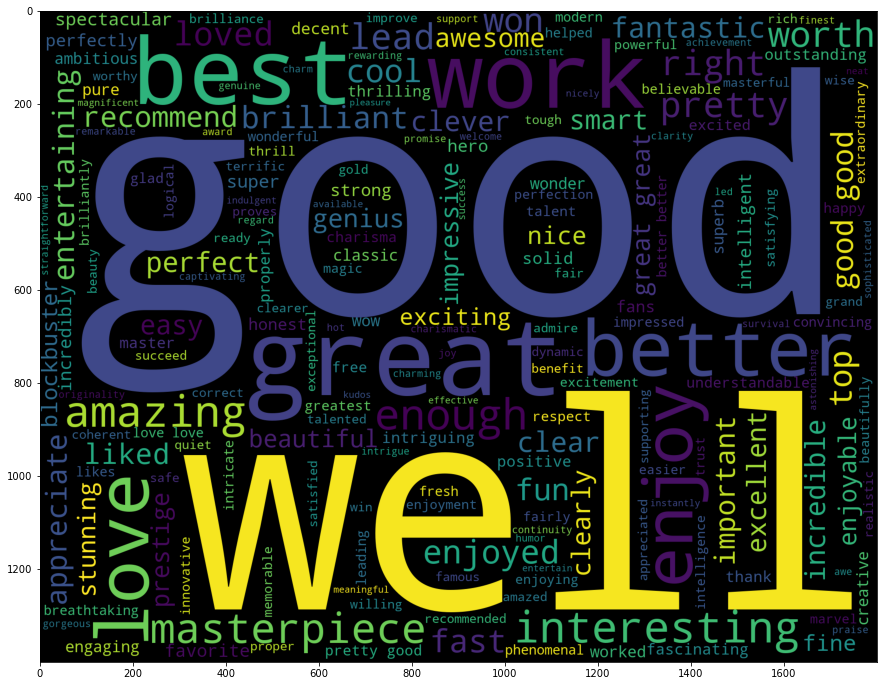

In [44]:
wordcloud_pos_in_pos = WordCloud(
                      background_color='Black',
                      width=1800,
                      height=1400
                     ).generate(ip_pos_words)
plt.imshow(wordcloud_pos_in_pos)

# Negative Words

In [45]:
with open('negative-words.txt',"r") as neg:
    negwords = neg.read().split('\n')

In [46]:
ip_neg_in_neg = " ".join([w for w in reviews_words if w in negwords])

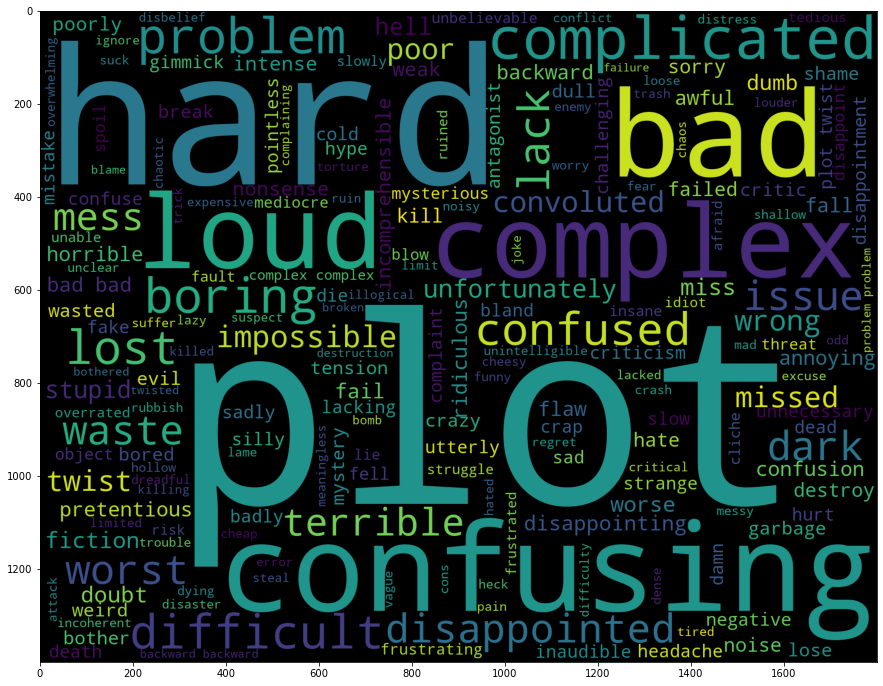

In [47]:
wordcloud_neg_in_neg = WordCloud(
                      background_color='black',
                      width=1800,
                      height=1400
                     ).generate(ip_neg_in_neg)
plt.imshow(wordcloud_neg_in_neg)

# Bigram Word Cloud

In [48]:
nltk.download('punkt')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\jaich\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [49]:
WNL = nltk.WordNetLemmatizer()

In [65]:
text = reviews_string.lower()

In [66]:
text

'hello again folks enjoy leaving reviews these mind twisting movies here will best explain timelines major characters characters through red timeline blue timeline red moving forward blue moving backwards red timeline hope makes sense here we sator timeline when young man finds box while working russia box contains gold blue technology mission find pieces doomsday devise wipes existence last piece needs missing threatens kat life with protagonist uses blue technology recover missing piece pieces doomsday device than goes back day yacht red timeline day kat sees someone dive off boat says disappeared theprotagonist timeline opening opera scene tortured passes test recruited learns blue technology gathers information lead him down path finds missing piece sator kat shot then uses blue technology heal heal blue timeline because was shot with blue technology only way come back red timeline was through another blue red machine only seen was airport protagonist must them back red timeline us

In [67]:
text = text.replace("'", "")
tokens = nltk.word_tokenize(text)
text1 = nltk.Text(tokens)

In [68]:
text_content = [s for s in text1 if len(s) !=0]
text_content = [WNL.lemmatize(t) for t in text1]
text_content

['hello',
 'again',
 'folk',
 'enjoy',
 'leaving',
 'review',
 'these',
 'mind',
 'twisting',
 'movie',
 'here',
 'will',
 'best',
 'explain',
 'timeline',
 'major',
 'character',
 'character',
 'through',
 'red',
 'timeline',
 'blue',
 'timeline',
 'red',
 'moving',
 'forward',
 'blue',
 'moving',
 'backwards',
 'red',
 'timeline',
 'hope',
 'make',
 'sense',
 'here',
 'we',
 'sator',
 'timeline',
 'when',
 'young',
 'man',
 'find',
 'box',
 'while',
 'working',
 'russia',
 'box',
 'contains',
 'gold',
 'blue',
 'technology',
 'mission',
 'find',
 'piece',
 'doomsday',
 'devise',
 'wipe',
 'existence',
 'last',
 'piece',
 'need',
 'missing',
 'threatens',
 'kat',
 'life',
 'with',
 'protagonist',
 'us',
 'blue',
 'technology',
 'recover',
 'missing',
 'piece',
 'piece',
 'doomsday',
 'device',
 'than',
 'go',
 'back',
 'day',
 'yacht',
 'red',
 'timeline',
 'day',
 'kat',
 'see',
 'someone',
 'dive',
 'off',
 'boat',
 'say',
 'disappeared',
 'theprotagonist',
 'timeline',
 'opening',


In [69]:
bigram_list = list(nltk.bigrams(text_content))
print(bigram_list)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [70]:
dictionary2 = [' '.join(tup) for tup in bigram_list]
print (dictionary2)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



## We will use count vectoriser to view the freqeuncy of bigrams

In [56]:
from sklearn.feature_extraction.text import CountVectorizer

In [71]:
vectorizer = CountVectorizer(ngram_range=(2,2))

In [72]:
bag_of_words = vectorizer.fit_transform(dictionary2)

In [73]:
vectorizer.vocabulary_

{'hello again': 82806,
 'again folk': 4689,
 'folk enjoy': 69535,
 'enjoy leaving': 55119,
 'leaving review': 101558,
 'review these': 150210,
 'these mind': 179716,
 'mind twisting': 114823,
 'twisting movie': 188807,
 'movie here': 118844,
 'here will': 83668,
 'will best': 206877,
 'best explain': 20119,
 'explain timeline': 61557,
 'timeline major': 184153,
 'major character': 108631,
 'character character': 28828,
 'character through': 29411,
 'through red': 182086,
 'red timeline': 147347,
 'timeline blue': 184100,
 'blue timeline': 22407,
 'timeline red': 184181,
 'red moving': 147339,
 'moving forward': 119254,
 'forward blue': 70651,
 'blue moving': 22391,
 'moving backwards': 119237,
 'backwards red': 14109,
 'timeline hope': 184135,
 'hope make': 86526,
 'make sense': 109107,
 'sense here': 158702,
 'here we': 83652,
 'we sator': 201138,
 'sator timeline': 153609,
 'timeline when': 184222,
 'when young': 204259,
 'young man': 213476,
 'man find': 109590,
 'find box': 67727,


In [74]:
sum_words = bag_of_words.sum(axis=0)
word_freq = [(word, sum_words[0,idx]) for word, idx in vectorizer.vocabulary_.items()]
word_freq = sorted(word_freq, key= lambda x: x[1], reverse=True)
print(word_freq[:500])

[('time travel', 634), ('make sense', 445), ('have been', 438), ('action scene', 392), ('robert pattinson', 378), ('what wa', 363), ('first time', 328), ('will be', 325), ('sci fi', 315), ('would have', 299), ('more than', 286), ('feel like', 267), ('kenneth branagh', 263), ('would be', 258), ('action sequence', 246), ('too much', 238), ('understand what', 235), ('second time', 232), ('could have', 224), ('elizabeth debicki', 218), ('james bond', 202), ('what going', 200), ('wa going', 198), ('dark knight', 184), ('hard follow', 181), ('time inversion', 177), ('main character', 176), ('wa just', 173), ('sound mixing', 172), ('know what', 168), ('up with', 166), ('can not', 166), ('care about', 165), ('inception interstellar', 163), ('set piece', 163), ('special effect', 159), ('felt like', 152), ('character development', 149), ('with subtitle', 145), ('wa very', 141), ('very good', 140), ('with time', 139), ('ve seen', 138), ('too loud', 137), ('mind bending', 136), ('should be', 133),

# Bigram WordCloud

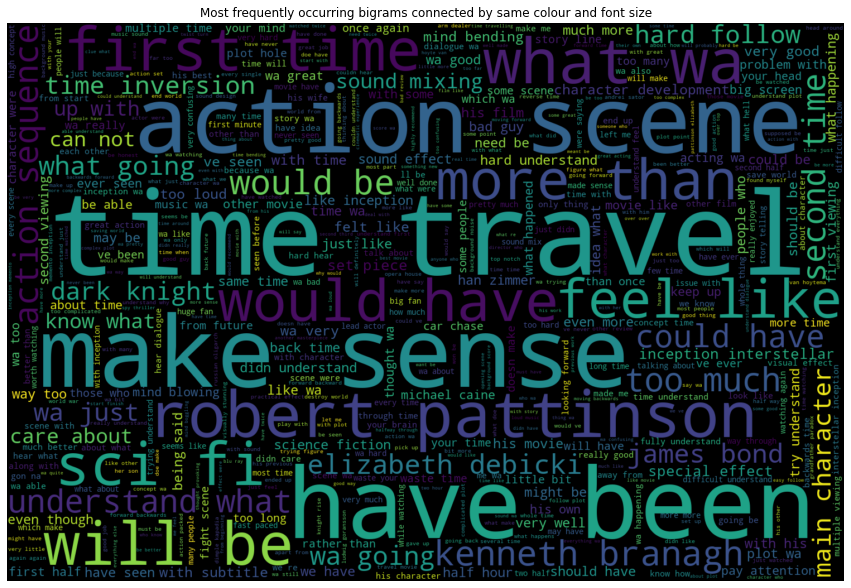

In [75]:
words_dict = dict(word_freq)
WC_height = 1000
WC_width = 1500
WC_max_words = 500
wordCloud = WordCloud(max_words = WC_max_words, height=WC_height, width=WC_width)
wordCloud.generate_from_frequencies(words_dict)
plt.title('Most frequently occurring bigrams connected by same colour and font size')
plt.imshow(wordCloud, interpolation='bilinear')
plt.axis("off")
plt.show()

We have successfully extracted reviews from IMDB. We then removed stop words and special characters from the reviews, we also extended our stopwords to exclude certain words which did not make sense

- We created Unigram wordcloud of all words
- We created Unigram wordcloud of only positive words
- We created Unigram wordcloud of only negative words
- We created Bigram wordcloud of all words. 

Since this movie is about time travel, so it was not surprising the see time travel being used together a lot of time
Overall generally happy reviews.

## The way Business/client can use this information is as follows:

- It states the emotions of the movie goers what top words they use when writing the reviews
- Top positive words and Top negative words used by viewers
- We can deep dive further on negative comments to understand why viewers are not happy